In [1]:
%load_ext autoreload
%autoreload 2

import sys
sys.path.append("../../../src/")

import os
import pandas as pd
import numpy as np
import random
from eda.utils_plot import get_upack_patch, save2pdf, visualize_col_data
from eda.general_eda import general_stats, general_eda_main

## Stats computation & analysis of AI4boundaries dataset

For each country:

1. Download image mask.
2. compute patch stats.
3. compute general stats.
4. download images+masks for problematic patches (e. g. no fields, small number of fields, small percentage of fields, complex fields, ...).
5. visualize random problematic patches.
6. final analysis for country.

Comparison analysis between countries. Localization. Number of parcels, area covered with fields, parcels sizes, parcels geometry, ...
Final analysis.

In [3]:
SENTINEL2_DIR = "C:\\Users\\alena.bakhoryna\\Documents\\code\\ai4boundaries_dataset" # your path here

## Slovenia (SI)

In [4]:
country = "SI"

#### General EDA for the country

General information: 
           n_fields  prc_fields  sm_area_cnt  bg_area_cnt  sm_solidity_cnt  \
count   301.000000  301.000000   301.000000   301.000000       301.000000   
mean    349.621262   31.695349   156.833887     0.166113         0.737542   
std     286.707277   22.975279   156.730572     0.576467         1.351870   
min       0.000000    0.000000     0.000000     0.000000         0.000000   
25%      58.000000    9.700000    25.000000     0.000000         0.000000   
50%     365.000000   29.900000   129.000000     0.000000         0.000000   
75%     530.000000   50.900000   224.000000     0.000000         1.000000   
max    1416.000000   79.700000   973.000000     4.000000         7.000000   

       bg_solidity_cnt  sm_eccentricity_cnt    area_min    area_mean  \
count       301.000000           301.000000  287.000000   287.000000   
mean        139.382060             8.667774    3.682927   102.155248   
std         110.954601             8.543765   12.696311   150.04406

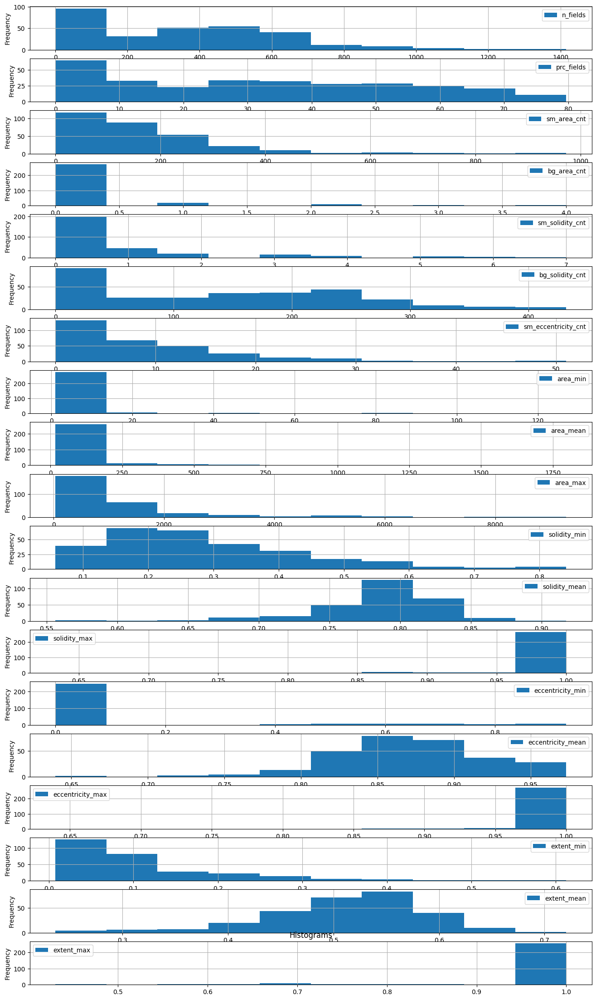

Total number of fields 0.11 M
Total area of fields in ha 6.25 M
Number of patches without fields present 14 (4.65%)
Number of patches with small percentage  (< 10) of fields present 63 (20.93%)
Number of patches with small number (< 40) of fields present 54 (17.94%)
Number of patches with small number or small percentage of fields present combined 72 (23.92%)
Number of patches with small number & small percentage of fields present combined 45 (14.95%)
Number of patches with n_fields (>= 923.04) of fields present 11 (3.65%)
Number of patches with prc_fields (>= 75.0) of fields present 5 (1.66%)
Number of patches with prc_fields (< 25.0) of fields present 124 (41.2%)
Number of patches with sm_area_cnt (>= 470.3) of fields present 12 (3.99%)
Number of patches with bg_area_cnt (>= 1.32) of fields present 13 (4.32%)
Number of patches with sm_solidity_cnt (>= 3.44) of fields present 19 (6.31%)
Number of patches with bg_solidity_cnt (>= 361.29) of fields present 9 (2.99%)
Number of patches wi

In [5]:
data = general_eda_main(SENTINEL2_DIR, country,
                     sm_prc_fields=10, sm_num_fields=40)

### Visualizations of the country data

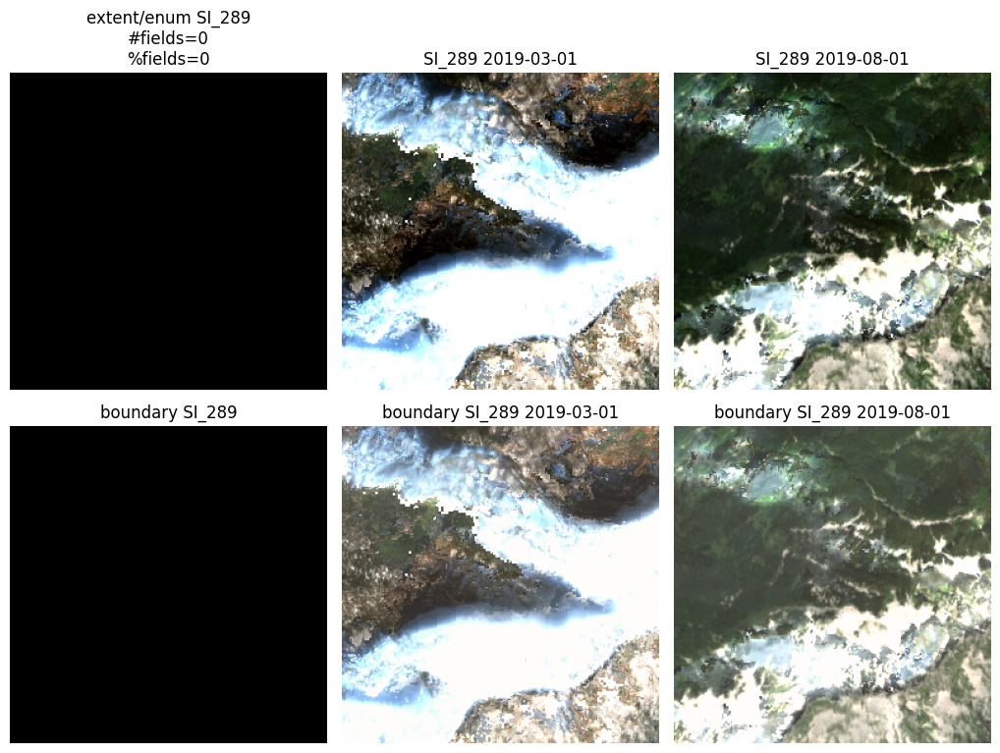

In [11]:
# visualize the data with no fields
visualize_col_data(data, SENTINEL2_DIR, country=country, col='no_field', num_img=2,
                       num_plots=1)

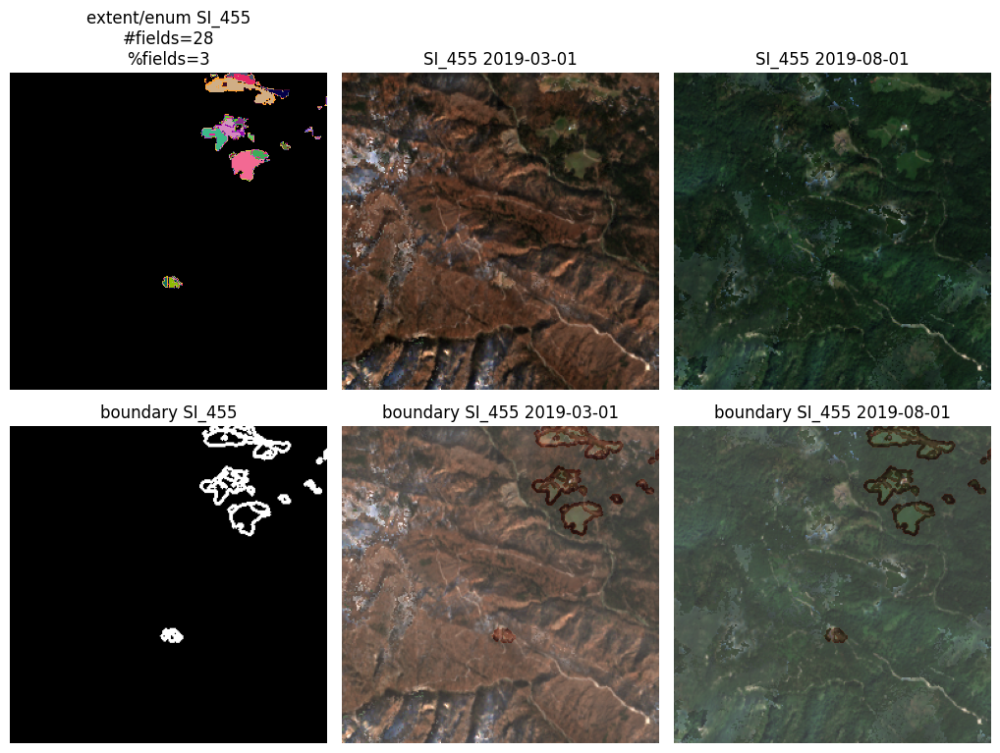

In [13]:
# visualize the data with small number of fields (<40)
visualize_col_data(data, SENTINEL2_DIR, country=country, col='sm_num_fields', num_img=2,
                       num_plots=1) # montains

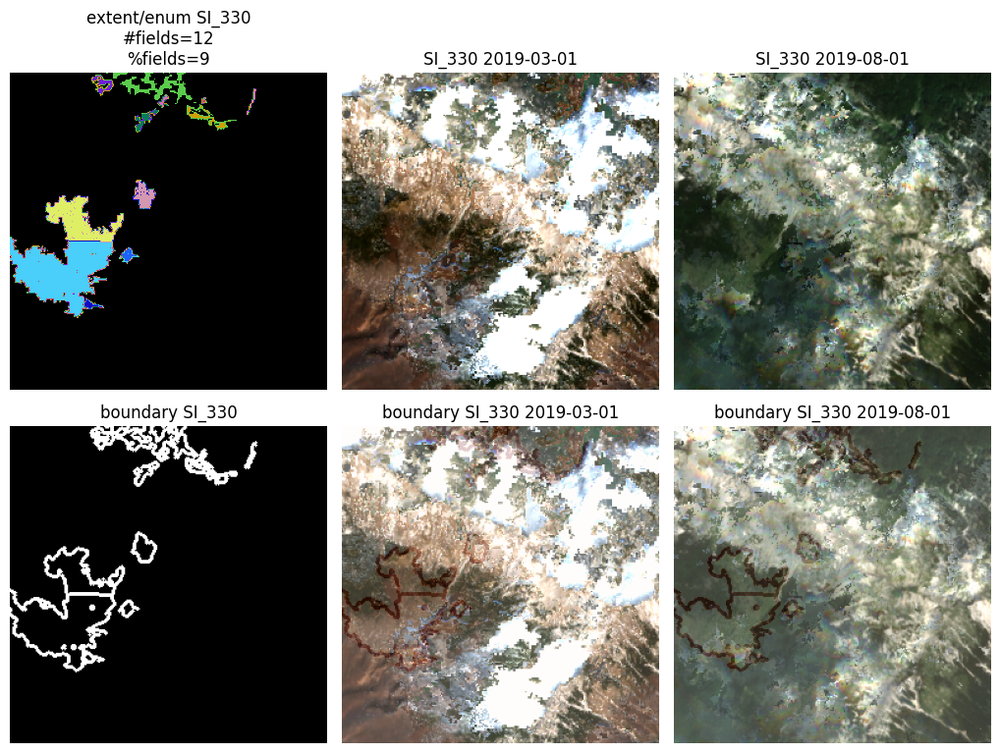

In [15]:
# visualize the data with small % of fields (<10%)
visualize_col_data(data, SENTINEL2_DIR, country=country, col='sm_prc_fields', num_img=2,
                       num_plots=1) # cloud artifats

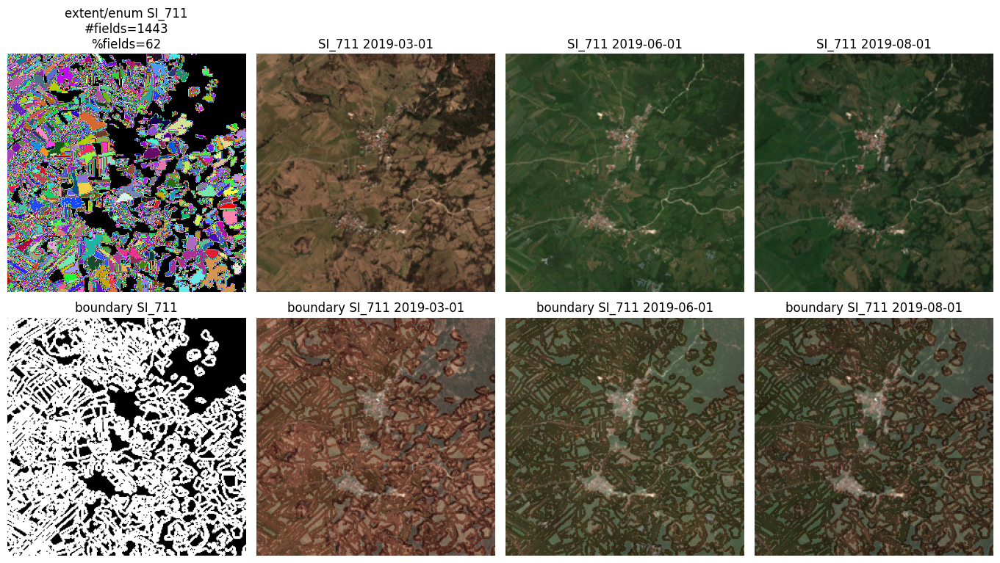

In [16]:
# visualze patches with a lot of fields present
# Number of patches with n_fields (>= 923.04) of fields present 11 (3.65%)
visualize_col_data(data, SENTINEL2_DIR, country=country, col='n_fields_gt', num_img=3,
                       num_plots=1) # very small parcels

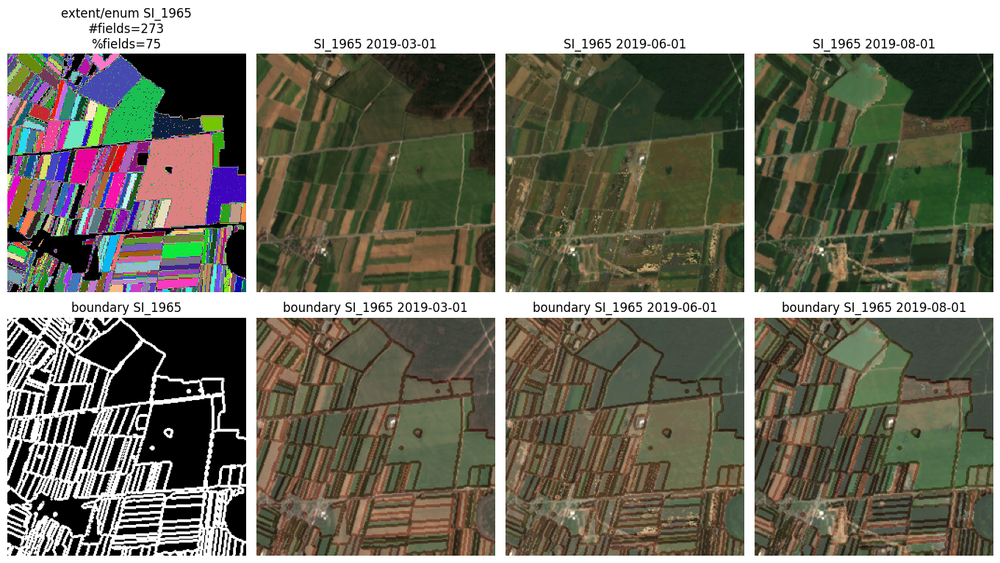

In [18]:
# visualze patches with a lot of % fields present
# Number of patches with prc_fields (>= 75.0) of fields present 5 (1.66%)
visualize_col_data(data, SENTINEL2_DIR, country=country, col='prc_fields_gt', num_img=3,
                       num_plots=1) # others -> same vis as for 'n_fields_gt'

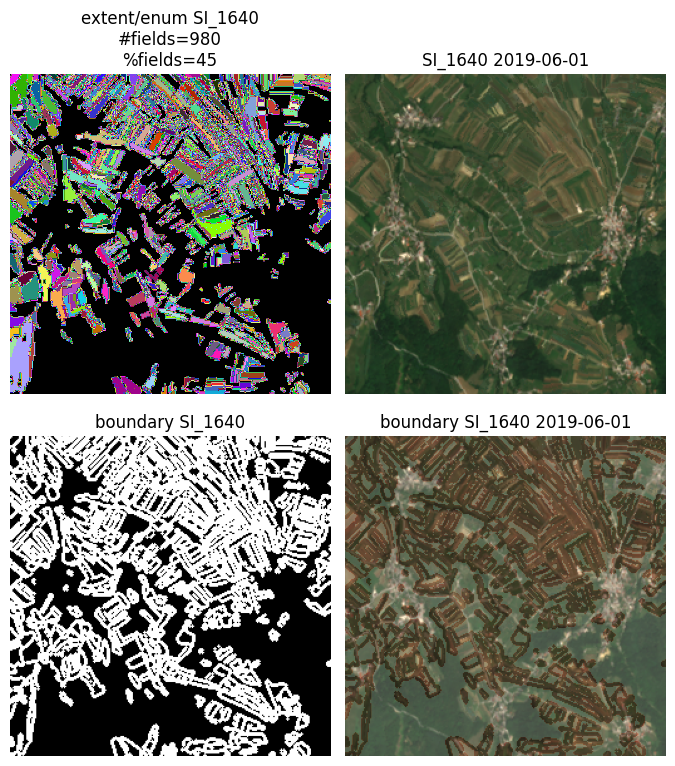

In [26]:
# visualze the patches with #field small area > 108
# Number of patches with sm_area_cnt (>= 470.3) of fields present 12 (3.99%)
visualize_col_data(data, SENTINEL2_DIR, country=country, col='sm_area_cnt_gt', num_img=1,
                       num_plots=1) # no intresent -> same vis as for 'n_fields_gt'

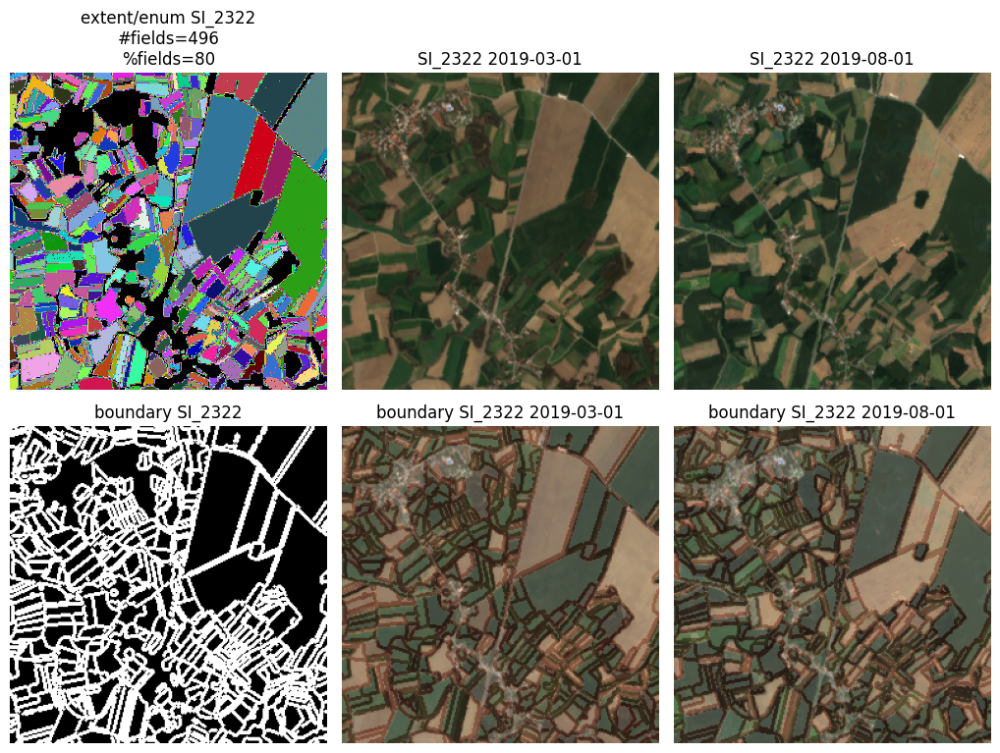

In [29]:
# visualze the patches with the following rool
# Number of patches with bg_area_cnt (>= 1.32) of fields present 13 (4.32%)
visualize_col_data(data, SENTINEL2_DIR, country=country, col='bg_area_cnt_gt', num_img=2,
                       num_plots=1) # couple of bigs parcels with majority small in the neighbourhood

In [ ]:
# visualze the patches with the following rool
# Number of patches with sm_solidity_cnt (>= 3.44) of fields present 19 (6.31%)
visualize_col_data(data, SENTINEL2_DIR, country=country, col='sm_solidity_cnt_gt', num_img=1,
                       num_plots=1) # not much info

In [ ]:
# visualze the patches with the following rool
# Number of patches with bg_solidity_cnt (>= 361.29) of fields present 9 (2.99%)
visualize_col_data(data, SENTINEL2_DIR, country=country, col='bg_solidity_cnt_gt', num_img=2,
                       num_plots=1) # no much intersent (rectangular/almost square compact fields)

In [ ]:
# visualze the patches with the following rool
# Number of patches with sm_eccentricity_cnt (>= 25.76) of fields present 16 (5.32%)
visualize_col_data(data, SENTINEL2_DIR, country=country, col='sm_eccentricity_cnt_gt', num_img=2,
                       num_plots=1) # no intreset (small parcels, isolated fields, ...)

### Conclusion for the country (FR)



March, April (not much of the greenary visible yet in some cases). Problem of differentiating crop fields if there's nothing is planted!!!!!!

Isolated fields (dominate sause of location in montains):

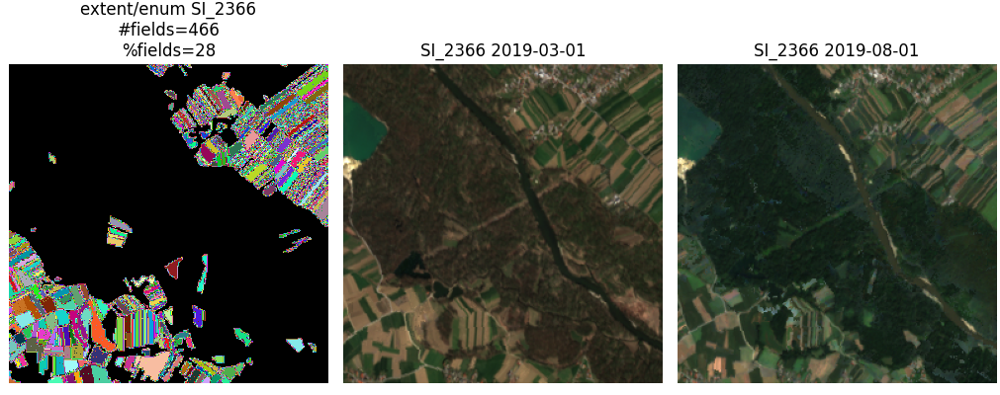

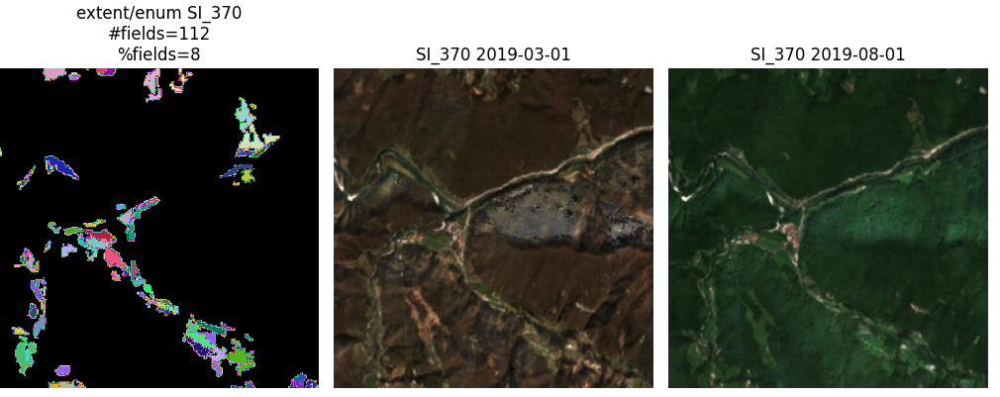

Very small shapes for fields are present (montains):

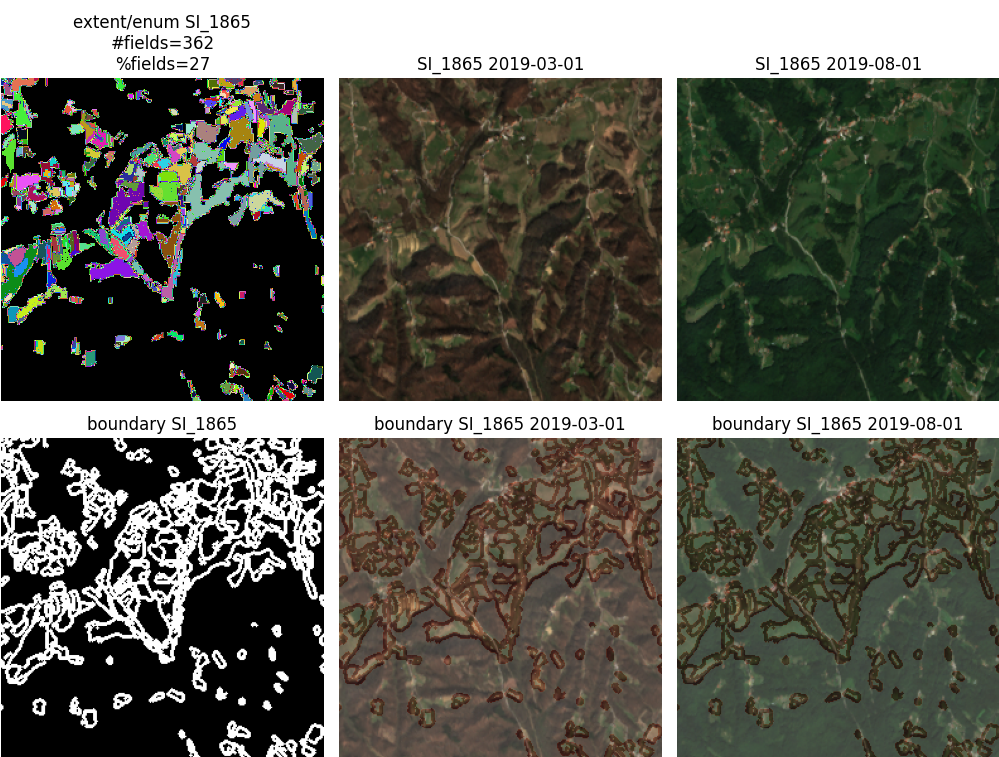

Very Small parcels for fields (regular rect / square):

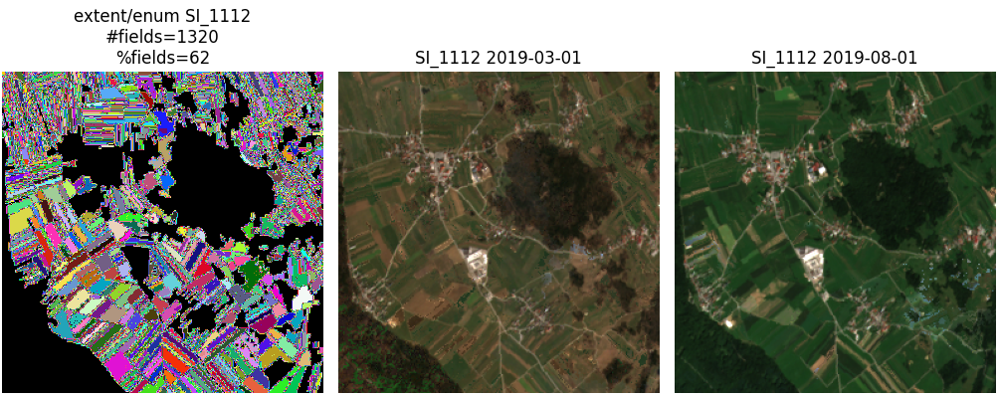

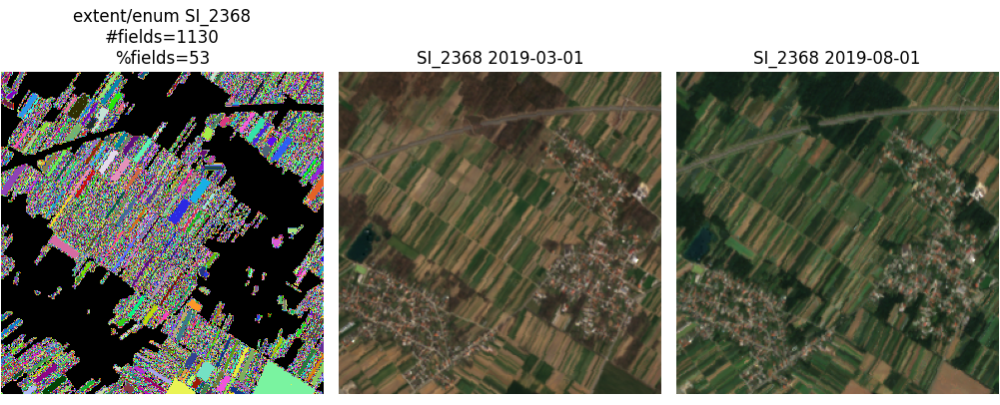

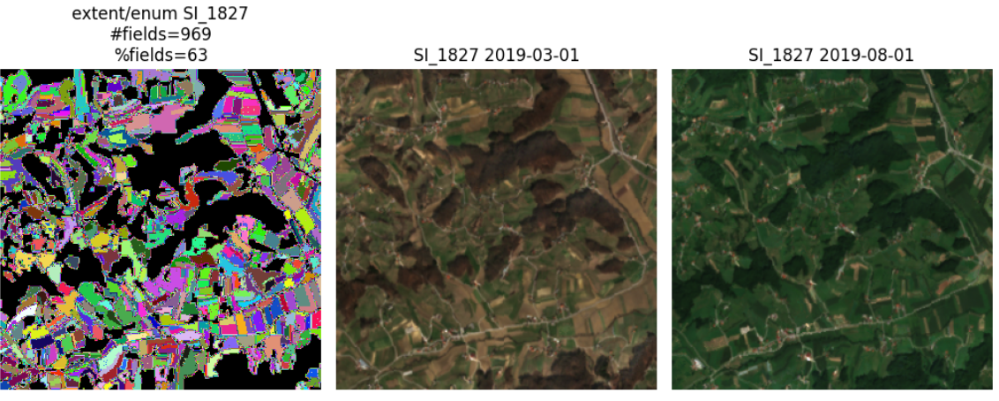

Based on eccentricity visualizations -> no circular fields. 

__TO BE DELETED__: (Number of patches without fields present 14 (4.65%)) +
(Number of patches with small number or small percentage of fields present combined 72 (23.92%)) -> ~29% delete for the training data (clouds artifacts, forest or other greenary/ montains, not clear if there shoud be a field a not).
